In [1]:
!pip install ultralytics

In [2]:
import os
import pandas as pd
from tqdm.auto import tqdm
import shutil
import yaml
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# --- Helper Function for Clean Bounding Box Plotting ---
def plot_one_box(box, img, color=(128, 128, 128), label=None, line_thickness=3):
    """
    Plots a single bounding box on an image with a professional, non-overlapping label.

    Args:
        box (list): Bounding box coordinates in [x1, y1, x2, y2] format.
        img (numpy.ndarray): The image to draw on.
        color (tuple): The color of the bounding box and label background.
        label (str): The text label for the box.
        line_thickness (int): The thickness of the bounding box lines.
    """
    # Setup
    tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness
    c1, c2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))

    # Draw the main bounding box
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)

    if label:
        # Calculate text size and setup for label background
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]

        # Define label background rectangle position
        # Place it just outside the top-left corner of the box
        label_bg_c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3

        # Draw the filled rectangle for the label background
        cv2.rectangle(img, c1, label_bg_c2, color, -1, cv2.LINE_AA)  # filled

        # Put the label text on the background
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)



In [4]:
"""
## **1. Setup and Path Definitions**
"""

print("\n--- 1. Setup and Environment Configuration ---")
try:
    from google.colab import drive
    drive.mount('/content/drive')
    print("Google Drive mounted successfully.")
    # --- Define Paths (Colab Environment) ---
    base_data_path = '/content/drive/MyDrive/CSE425_Project/AI(Image_Processing)'
    yolo_base_path = '/content/drive/MyDrive/CSE425_Project/yolo_dental_dataset'

except ImportError:
    print("Not in Google Colab. Assuming local environment.")
    # --- Define Paths (Local Environment - MODIFY AS NEEDED) ---
    # You might need to change these paths if you are not running in Colab
    base_data_path = 'AI(Image_Processing)'
    yolo_base_path = 'yolo_dental_dataset'


train_dir = os.path.join(base_data_path, 'train')
valid_dir = os.path.join(base_data_path, 'valid')
test_dir = os.path.join(base_data_path, 'test')

# Define paths for the new YOLO dataset structure
yolo_images_train = os.path.join(yolo_base_path, 'images', 'train')
yolo_labels_train = os.path.join(yolo_base_path, 'labels', 'train')
yolo_images_valid = os.path.join(yolo_base_path, 'images', 'valid')
yolo_labels_valid = os.path.join(yolo_base_path, 'labels', 'valid')
yolo_images_test = os.path.join(yolo_base_path, 'images', 'test')
yolo_labels_test = os.path.join(yolo_base_path, 'labels', 'test')

# Create the required directories
for path in [yolo_images_train, yolo_labels_train, yolo_images_valid, yolo_labels_valid, yolo_images_test, yolo_labels_test]:
    os.makedirs(path, exist_ok=True)
print("YOLO directory structure created/verified.")

# Define Annotation CSV Paths
train_csv_path = os.path.join(train_dir, '_annotations.csv')
valid_csv_path = os.path.join(valid_dir, '_annotations.csv')
test_csv_path = os.path.join(test_dir, '_annotations.csv')


--- 1. Setup and Environment Configuration ---
Mounted at /content/drive
Google Drive mounted successfully.
YOLO directory structure created/verified.


In [5]:
"""
## **2. Data Conversion to YOLO Format**
"""
print("\n--- 2. Converting CSV Annotations to YOLO .txt Format ---")

def convert_to_yolo_format(df, class_to_id, source_img_dir, target_img_dir, target_label_dir):
    """Converts CSV annotations to YOLO format and copies images."""
    os.makedirs(target_img_dir, exist_ok=True)
    os.makedirs(target_label_dir, exist_ok=True)

    unique_files = df['filename'].unique()
    print(f"Copying {len(unique_files)} images from {source_img_dir} to {target_img_dir}...")
    for filename in tqdm(unique_files, desc="Copying images"):
        shutil.copy(os.path.join(source_img_dir, filename), target_img_dir)

    print(f"Generating YOLO annotation files in {target_label_dir}...")
    for filename, group in tqdm(df.groupby('filename'), desc="Generating labels"):
        label_path = os.path.join(target_label_dir, os.path.splitext(filename)[0] + '.txt')
        with open(label_path, 'w') as f:
            for _, row in group.iterrows():
                class_id = class_to_id[row['class']]
                img_width, img_height = row['width'], row['height']
                xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']

                x_center = ((xmin + xmax) / 2) / img_width
                y_center = ((ymin + ymax) / 2) / img_height
                bbox_width = (xmax - xmin) / img_width
                bbox_height = (ymax - ymin) / img_height

                f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {bbox_width:.6f} {bbox_height:.6f}\n")

try:
    train_df = pd.read_csv(train_csv_path)
    valid_df = pd.read_csv(valid_csv_path)
    test_df = pd.read_csv(test_csv_path)
    print("Annotation CSVs loaded.")

    all_classes = sorted(pd.concat([train_df, valid_df, test_df])['class'].unique())
    class_to_id = {cls_name: i for i, cls_name in enumerate(all_classes)}
    print(f"\nDiscovered {len(all_classes)} classes: {all_classes}")

    convert_to_yolo_format(train_df, class_to_id, train_dir, yolo_images_train, yolo_labels_train)
    convert_to_yolo_format(valid_df, class_to_id, valid_dir, yolo_images_valid, yolo_labels_valid)
    convert_to_yolo_format(test_df, class_to_id, test_dir, yolo_images_test, yolo_labels_test)
    print("\nData conversion to YOLO format is complete.")

except FileNotFoundError as e:
    print(f"Error: One or more CSV files not found. Please check paths: {e}")
    print("Skipping data conversion.")


--- 2. Converting CSV Annotations to YOLO .txt Format ---
Annotation CSVs loaded.

Discovered 4 classes: ['Cavity', 'Fillings', 'Impacted Tooth', 'Implant']
Copying 1075 images from /content/drive/MyDrive/CSE425_Project/AI(Image_Processing)/train to /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/images/train...


Copying images:   0%|          | 0/1075 [00:00<?, ?it/s]

Generating YOLO annotation files in /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/labels/train...


Generating labels:   0%|          | 0/1075 [00:00<?, ?it/s]

Copying 121 images from /content/drive/MyDrive/CSE425_Project/AI(Image_Processing)/valid to /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/images/valid...


Copying images:   0%|          | 0/121 [00:00<?, ?it/s]

Generating YOLO annotation files in /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/labels/valid...


Generating labels:   0%|          | 0/121 [00:00<?, ?it/s]

Copying 73 images from /content/drive/MyDrive/CSE425_Project/AI(Image_Processing)/test to /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/images/test...


Copying images:   0%|          | 0/73 [00:00<?, ?it/s]

Generating YOLO annotation files in /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/labels/test...


Generating labels:   0%|          | 0/73 [00:00<?, ?it/s]


Data conversion to YOLO format is complete.


In [6]:
"""
## **3. Create YOLO `data.yaml` File**
"""
print("\n--- 3. Creating data.yaml Configuration File ---")

# Re-create class mapping if conversion was skipped but files exist
if 'all_classes' not in locals():
    try:
        temp_df = pd.read_csv(train_csv_path)
        all_classes = sorted(temp_df['class'].unique())
        print(f"Found classes from CSV file: {all_classes}")
    except FileNotFoundError:
        print("Warning: Could not automatically determine classes. Please ensure data is present.")
        all_classes = []


yaml_config = {
    'train': yolo_images_train,
    'val': yolo_images_valid,
    'test': yolo_images_test,
    'nc': len(all_classes),
    'names': all_classes
}

yaml_file_path = os.path.join(yolo_base_path, 'data.yaml')
with open(yaml_file_path, 'w') as f:
    yaml.dump(yaml_config, f, sort_keys=False)

print(f"data.yaml created successfully at: {yaml_file_path}")
print("Contents:\n", yaml.dump(yaml_config))


--- 3. Creating data.yaml Configuration File ---
data.yaml created successfully at: /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/data.yaml
Contents:
 names:
- Cavity
- Fillings
- Impacted Tooth
- Implant
nc: 4
test: /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/images/test
train: /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/images/train
val: /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/images/valid



In [7]:
"""
## **4. Train the YOLOv10 Model**
"""
print("\n--- 4. Training YOLOv10 Model ---")

model = YOLO('yolov10n.pt')  # Load the latest lightweight pretrained model

# Train the model
# Results are saved automatically to a `runs/detect/` directory
results = model.train(
    data=yaml_file_path,
    epochs=40,
    imgsz=640,
    patience=10,
    batch=16,
    project='dental_detection', # Project folder name
    name='yolov10n_run1',       # Experiment name for the new model
    exist_ok=True             # Allow overwriting existing experiment
)

print("\nTraining complete.")


--- 4. Training YOLOv10 Model ---
Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov10n_run1, nbs=64, nms=False, opset=None, optimize=False, op

In [8]:
val_results = model.val(
    data=yaml_file_path,
    split='val',
    plots=True,        # ensures plots are generated
    save_hybrid=True,  # saves additional analysis
    save_json=True     # COCO-style metrics file
)

WARNING ⚠️ 'save_hybrid' is deprecated and will be removed in the future.
Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 102 layers, 2,265,948 parameters, 0 gradients, 6.5 GFLOPs
val: Fast image access ✅ (ping: 0.8±0.9 ms, read: 7.8±4.9 MB/s, size: 15.1 KB)
val: Scanning /content/drive/MyDrive/CSE425_Project/yolo_dental_dataset/labels/valid.cache... 121 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 121/121 202.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.0it/s 2.7s
                   all        121        780      0.755      0.708       0.76      0.498
                Cavity         23         43       0.48      0.429       0.39      0.194
              Fillings         97        540      0.855      0.864      0.907      0.594
        Impacted Tooth         25         38      0.774      0.658      0.796      0.545
               Implant   

In [9]:
val_dir = val_results.save_dir  # this is where PR_curve.png and F1_curve.png are actually saved
print("Validation results saved at:", val_dir)

Validation results saved at: /content/dental_detection/yolov10n_run1


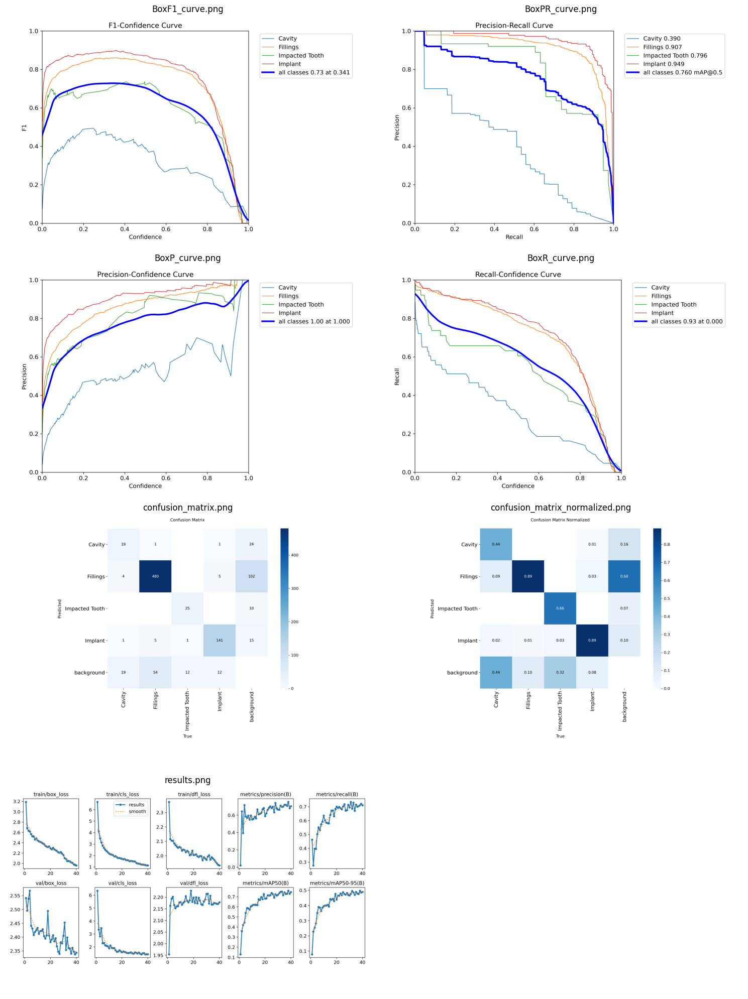

In [10]:
import glob, cv2, matplotlib.pyplot as plt, os
import math

val_dir = "/content/dental_detection/yolov10n_run1"
plots = sorted(glob.glob(os.path.join(val_dir, "*.png")))

# Define grid size
num_images = len(plots)
cols = 2  # number of columns in the grid
rows = math.ceil(num_images / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axes array for easy iteration
axes = axes.flatten()

for ax, path in zip(axes, plots):
    img = cv2.imread(path)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.axis("off")
    ax.set_title(os.path.basename(path), fontsize=12)

# Turn off any unused axes
for i in range(len(plots), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()



--- 5. Performing Inference on Test Images with Improved Visualization ---
Loaded best model from: /content/dental_detection/yolov10n_run1/weights/best.pt


Running inference:   0%|          | 0/73 [00:00<?, ?it/s]

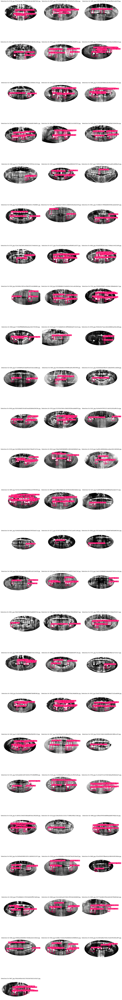

In [11]:
"""
## **5. Inference with Improved Visualization**
"""
print("\n--- 5. Performing Inference on Test Images with Improved Visualization ---")

# Load the best trained model
# The results object from training contains the path to the best model
best_model_path = os.path.join(results.save_dir, 'weights', 'best.pt')
trained_model = YOLO(best_model_path)
print(f"Loaded best model from: {best_model_path}")

# Get a list of test images
test_image_files = os.listdir(yolo_images_test)[:73] # Display first 9 images

# Setup plot
n_images = len(test_image_files)
n_cols = 3
n_rows = (n_images + n_cols - 1) // n_cols
plt.figure(figsize=(n_cols * 6, n_rows * 6))

for i, img_file in enumerate(tqdm(test_image_files, desc="Running inference")):
    img_path = os.path.join(yolo_images_test, img_file)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Keep an RGB copy for plotting

    # Perform prediction
    pred_results = trained_model.predict(source=img_path, verbose=False)

    # Draw boxes using the custom function
    for r in pred_results:
        boxes = r.boxes
        for box in boxes:
            xyxy = box.xyxy[0]  # get box coordinates in (top, left, bottom, right) format
            conf = box.conf[0]
            cls = int(box.cls[0])
            class_name = trained_model.names[cls]
            label = f'{class_name} {conf:.2f}'
            plot_one_box(xyxy, img_rgb, label=label, color=(255, 0, 100), line_thickness=2)

    # Display the result
    plt.subplot(n_rows, n_cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(f'Detections for {img_file}', fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [13]:
import pickle

In [14]:
## 6. Save Model and Class Mappings for Deployment
print("\n--- 6. Saving Final Model and Mappings ---")

# Define the directory to save the files
save_dir = '/content/drive/MyDrive/CSE425_Project/Trained Model Files'
os.makedirs(save_dir, exist_ok=True)
print(f"Created directory: {save_dir}")

# --- 1. Save the Model (as .pt) ---
# The best model is already saved by the training process. We just need to copy it.
best_model_source_path = os.path.join(results.save_dir, 'weights', 'best.pt')
best_model_dest_path = os.path.join(save_dir, 'dental_yolov10_best.pt')

try:
    shutil.copy(best_model_source_path, best_model_dest_path)
    print(f"Model successfully copied to: {best_model_dest_path}")
except FileNotFoundError:
    print(f"Error: Could not find the best model at {best_model_source_path}. Please check the training results path.")


# --- 2. Save the Class Mapping (as .pkl) ---
# The 'class_to_id' dictionary is crucial for interpreting the model's output.
# We will save it using pickle.
class_mapping_path = os.path.join(save_dir, 'class_mapping.pkl')
with open(class_mapping_path, 'wb') as f:
    pickle.dump(class_to_id, f)
print(f"Class mapping dictionary saved to: {class_mapping_path}")

print("\nAll necessary files for deployment have been saved. ✅")


--- 6. Saving Final Model and Mappings ---
Created directory: /content/drive/MyDrive/CSE425_Project/Trained Model Files
Model successfully copied to: /content/drive/MyDrive/CSE425_Project/Trained Model Files/dental_yolov10_best.pt
Class mapping dictionary saved to: /content/drive/MyDrive/CSE425_Project/Trained Model Files/class_mapping.pkl

All necessary files for deployment have been saved. ✅
